# Demo versione seriale

In [1]:
# Carica il codice per la simulazione
include("src/serialmd.jl")

Main.Serialmd

In [2]:
# Carica il codice per salvataggi su disco, generare dati, creare animazioni
include("src/utilmd.jl")

Main.Utilmd

In [3]:
# Esegue una simulazione con dati casuali e salva su disco i dati per ripresa.
function random_sim(nsteps, sinterval, dt, dim, part_num, num_part_types, box_size, periodic, restrict)
    # Genera dati casuali
    pos, acc, vel, masses, interactions, ptypes = Serialmd.random_data(dim, part_num, num_part_types, box_size)
    
    # Simulazione (track = true)
    spos = Serialmd.dynamics_sim!(nsteps, sinterval, true, dt, pos, vel, acc, masses, interactions, ptypes, box_size, periodic, restrict)
    
    # Per il salvataggio su disco salvare anche le altre matrici modificate
    file_name = "random_$(dim)D_$(part_num)p"
    Utilmd.disk_save(file_name * "_data", spos[end,:,:], vel, acc, masses, interactions, ptypes, box_size, periodic, restrict)
    
    return spos, ptypes, masses, interactions, file_name    
end

random_sim (generic function with 1 method)

### Simulazione 3D

In [4]:
# Parametri animazione
const duration3D = 30; # durata in secondi
const lims3D = (0, 10); # Limiti della visuale
const ticks3D = 0:1:10; # Tacche su ogni asse

In [5]:
# Simulazione 3D
spos3D, ptypes3D, masses3D, interactions3D, file_name3D = random_sim(30*duration3D, 1, 1/30, 3, 100, 3, 10.0, false, true);

In [6]:
# Verifica consistenza
println("Any NaN?: ", any(isnan, spos3D))
println("Any Inf?: ", any(isinf, spos3D))

Any NaN?: false
Any Inf?: false


┌ Info: Saved animation to 
│   fn = C:\Users\enric\Desktop\gitrepos\molecular-dynamics-cuda\main\random_3D_100p.gif
└ @ Plots C:\Users\enric\.julia\packages\Plots\12uaJ\src\animation.jl:98


Plots.AnimatedGif("C:\\Users\\enric\\Desktop\\gitrepos\\molecular-dynamics-cuda\\main\\random_3D_100p.gif")
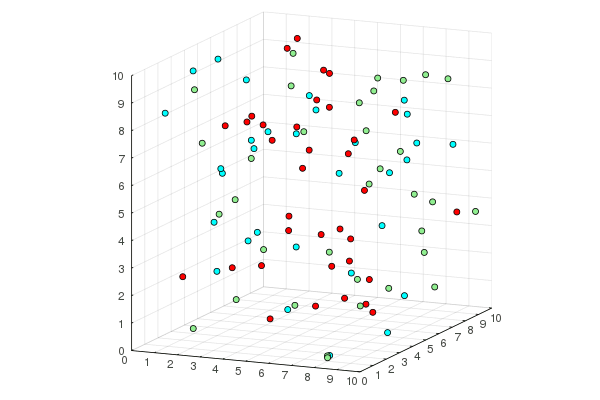

In [7]:
# Genera animazione e salva gif su disco
Utilmd.gif_animate3D(spos3D, ptypes3D, lims3D, ticks3D, file_name3D)

In [8]:
# Visualizza masse
masses3D

3-element Array{Float64,1}:
 3.0
 1.0
 3.0

In [9]:
# Visualizza interazioni
interactions3D

3×3 Array{Float64,2}:
 -0.0944448   0.327569   0.884832
  0.327569   -0.563314   0.812197
  0.884832    0.812197  -0.151818

In [10]:
# RESUME TEST #
# Continua simulazione da dati salvati
ld = Utilmd.disk_load(file_name3D * "_data")
spos3DResumed = Serialmd.dynamics_sim!(30*duration3D, 1, true, 1/30, ld.pos, ld.vel, ld.acc, ld.masses, ld.interactions, ld.ptypes, ld.box_size, ld.periodic, ld.restrict);

┌ Info: Saved animation to 
│   fn = C:\Users\enric\Desktop\gitrepos\molecular-dynamics-cuda\main\random_3D_100p_resumed.gif
└ @ Plots C:\Users\enric\.julia\packages\Plots\12uaJ\src\animation.jl:98


Plots.AnimatedGif("C:\\Users\\enric\\Desktop\\gitrepos\\molecular-dynamics-cuda\\main\\random_3D_100p_resumed.gif")
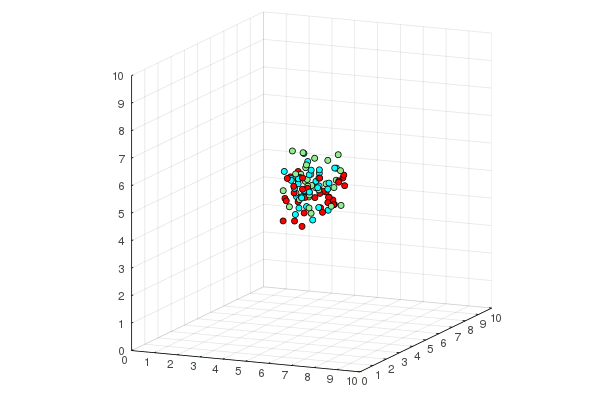

In [11]:
# Genera animazione e salva gif su disco
Utilmd.gif_animate3D(spos3DResumed, ld.ptypes, lims3D, ticks3D, file_name3D * "_resumed")

### Simulazione 2D

In [12]:
# Parametri animazione
const duration2D = 30; # durata in secondi
const lims2D = (-10, 20); # Limiti della visuale
const ticks2D = -10:5:20; # Tacche su ogni asse

In [13]:
# Simulazione 2D
spos2D, ptypes2D, masses2D, interactions2D, file_name2D = random_sim(30*duration2D, 1, 1/30, 2, 300, 2, 10.0, true, false);

In [14]:
# Controllo consistenza
println("Any NaN?: ", any(isnan, spos2D))
println("Any Inf?: ", any(isinf, spos2D))

Any NaN?: false
Any Inf?: false


┌ Info: Saved animation to 
│   fn = C:\Users\enric\Desktop\gitrepos\molecular-dynamics-cuda\main\random_2D_300p.gif
└ @ Plots C:\Users\enric\.julia\packages\Plots\12uaJ\src\animation.jl:98


Plots.AnimatedGif("C:\\Users\\enric\\Desktop\\gitrepos\\molecular-dynamics-cuda\\main\\random_2D_300p.gif")
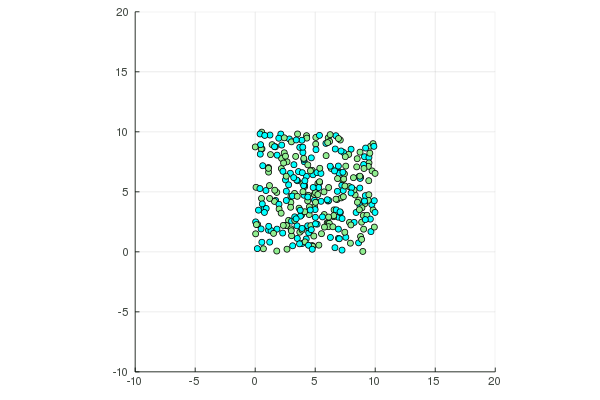

In [15]:
# Genera animazione e salva gif su disco
Utilmd.gif_animate2D(spos2D, ptypes2D, lims2D, ticks2D, file_name2D)

In [16]:
# Visualizza masse
masses2D

2-element Array{Float64,1}:
 1.0
 1.0

In [17]:
# Visualizza interazioni
interactions2D

2×2 Array{Float64,2}:
 -0.435469   0.652608
  0.652608  -0.619779